# Image Colorization Project

##### by Ardenghi, Bianco, Saveri and Zoccante

---

# Abstract

In this notebook, we will present our deep learning project, whose main focus is computer vision, and more specifically image colorization.
For the training and validation of our models, we have decided to use the MIRFlickr-25000 dataset and the Stanford Dogs dataset.


Our aim is to create a model to predict the RGB colorization of grayscale images, and in order to do we will map the images to the LAB color space, perform predictions in this space, and then map the results back to RGB. 

During this project we will explore different architectures (Convolutional Neural Networks, Attention Modules, etc.), presenting here the best model.


We will explore the application to sparse and to class-specific datasets, explaining the results, the difficulties and the possible next steps.

---

# First Section: Mirflickr Analysis

## Data Description

In [59]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose
from keras.layers import Activation, Dense, Dropout, Flatten
from keras.layers import BatchNormalization
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave
import numpy as np
import os
import random
import tensorflow as tf
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from keras.layers import MaxPooling2D, LayerNormalization
import concurrent.futures
from tqdm import tqdm
import os
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

In [12]:
directory = 'data/training'

In [60]:
# Visual display of some images from the dataset
def display_images(directory):
    image_files = os.listdir(directory)
    images = []
    counter = 0
    for image_file in image_files:
        counter += 1
        image_path = os.path.join(directory, image_file)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images.append(image)
        if counter > 16:
            break

    images = np.array(images, dtype = object)

    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 6))

    for i, ax in enumerate(axes.flatten()):
        ax.imshow(images[i])
        ax.set_xlabel(f'Size = {images[i].shape}')
        #ax.axis('off')

    plt.tight_layout()
    plt.show()

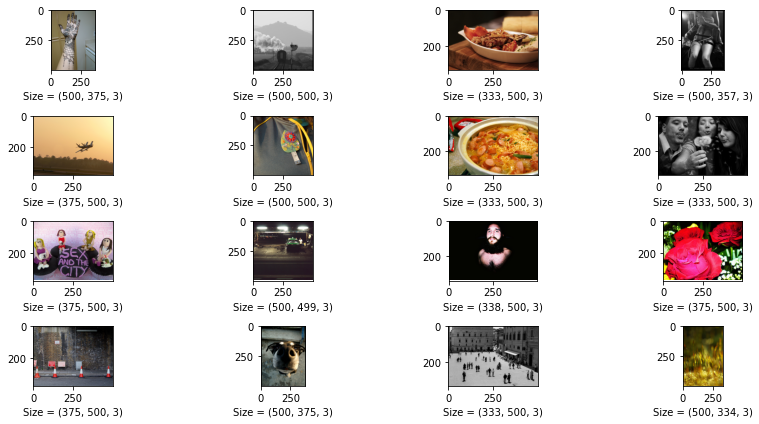

In [4]:
display_images(directory)

In [5]:
def plot_image(image):
    fig = plt.Figure(figsize=(12, 4))
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

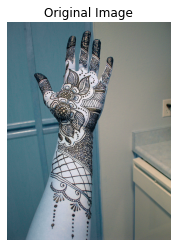

In [15]:
# Example of a single image
plot_image(cv2.imread(os.path.join(directory, os.listdir(directory)[0])))

As we can easily notice, the images are in RGB color scale, and have variable sizes, and will therefore need some preprocessing. Another interesting observation is that some images are by default greyscale, and therefore they will need to be removed or otherwise they might confuse our model.

# Preprocessing

The problem that we will tackle in this notebook is how to colorize a greyscale image. 
Before proceeding with the preprocessing task, we must first explain how we plan to tackle the colorization problem. The idea is to use images in the LAB color scheme, which have 3 color channels structured in the following way:
- L channel: it has range [0,100] and represents the **lightness** of the image, with low values representing *black* and high values representing *white*
- a channel: it has range [-128,128] and represents the **green-magenta** color, with negative values towards the *green* and positive values towards the *magenta*
- b channel: it has range [-128,128] and represents the **blue-yellow** color, with negative values towards the *blue* and positive values towards the *yellow*

We can consider the input greyscale image as an image only expressing the first channel (L channel) in the LAB space, and the colorization task simply boils down to predicting the values of the other two channels, given the first one.

In order to perform this task, we need to preprocess the images in the following way:
- Images must be transformed from RGB color space to LAB color space
- LAB input must be normalized 
- Images which are by default black and white should be removed from the training data

In [61]:
height = 200  #height of the image after reshaping
width = 200   #width of the image after reshaping

The next two functions will be used to resize the images to a constant shape, as well as normalize them and transform them from RGB to LAB. Let us describe them:
- **preprocess_image**: takes as input a single RGB image, resizes it to our desired height and width, then it maps it to LAB space and normalizes each channel. At the end the images are reshaped to the initial shape and returned by the function, along with the original shape of the image.
- **preprocess_images**: takes as input a list of images. This function iterates the _preprocess_image_ function defined before, and in the end returns an array of preprocessed images.
- **remove_outliers**: takes as input X and y arrays, and also a float value q which represents a quantile. This function computes the norm of the y (which represents the a and b channels) of every image, and removes the images which fall below the q quantile. This function is useful because many images in this dataset are in greyscale, and therefore training our model on such images (which have therefore very low values in the a and b channels) would be harmful.

In [62]:
def preprocess_image(image):

    img_shape = image.size
    resized_image = image.resize((height, width))
    resized_array = img_to_array(resized_image)
    image = np.array(resized_array, dtype=float)
    
    X = rgb2lab(1.0/255*image)[:,:,0]/100        #First we transform the input from RGB to LAB, then we normalize
    Y = rgb2lab(1.0/255*image)[:,:,1:]/128       #The normalization is 1/128 for the a and b channels because the input is in [-128,128]

    X = X.reshape(1, height, width, 1)
    Y = Y.reshape(1, height, width, 2)
    return img_shape, X, Y

In [63]:
def preprocess_images(images):
    X_batch = []
    Y_batch = []
    img_shapes = []
    
    for image in images:
        img_shape, X, Y = preprocess_image(image)
        img_shapes.append(img_shape)
        X_batch.append(X)
        Y_batch.append(Y)
    
    X_batch = np.concatenate(X_batch, axis=0)
    Y_batch = np.concatenate(Y_batch, axis=0)
    
    return img_shapes, X_batch, Y_batch

The next function will instead be applied in order to remove functions which are by default black and white

In [64]:
def remove_outliers(X_batch, Y_batch, quantile):
  
    norm_on_input = np.linalg.norm(Y_batch, axis = (1,2))
    norm_on_channels = np.linalg.norm(norm_on_input, axis = 1)
    q = np.quantile(norm_on_channels, quantile)
    temp = X_batch
    temp2 = Y_batch
    for i in reversed(range(len(Y_batch))):
  
        if norm_on_channels[i] <= q:
            temp = np.delete(temp, [i], axis = 0)
            temp2 = np.delete(temp2, [i], axis = 0)
    return temp, temp2

## Preliminary Analysis I: only one image

In this section of the notebook, we explore a very simple convolutional neural network, trained and evaluate on the same image, just to see if all the preprocessing functions are working correctly

In [65]:
# Useful function which automatically displays original image, greyscale image and predicted image

def plot_predicted_image(image, model):
    img_shape, X, Y = preprocess_image(image)
    
    # Generate predicted values
    output = model.predict(X)
    
    
    # Combine X (grayscale) and predicted values (AB channels)
    lab_image = np.zeros((height, width, 3))
    lab_image[:,:,0] = X[0][:,:,0] * 100
    lab_image[:,:,1:] = output[0] * 120
    
    lab_image = cv2.resize(lab_image, (img_shape[0], img_shape[1]))
    
    # Plot the images
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(lab_image[:,:,0], cmap='gray')
    axes[1].set_title('Grayscale Image')
    axes[1].axis('off')
    
    axes[2].imshow(lab2rgb(lab_image))
    axes[2].set_title('Image with Predicted Values')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate accuracy of the prediction
    #accuracy = model.evaluate(X, Y, batch_size=1)
    #print(f'Accuracy: {100 * (1 - accuracy):.2f}%')

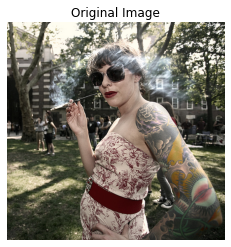

L channel shape:  (1, 200, 200, 1)
AB channel shape:  (1, 200, 200, 2)


In [13]:
image = Image.open(directory +'/im1.jpg')
plot_image(image)

size, X, Y = preprocess_image(image)

print("L channel shape: ", X.shape)
print("AB channel shape: ", Y.shape)

The channels are correctly separated. Now let's build a network!

In [61]:
# Building the neural network
model = Sequential()
model.add(InputLayer(input_shape=(None, None, 1)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))

# Compiling the NN
model.compile(optimizer='adam',loss='mse')

# Fitting the NN to img1
model.fit(x=X, y=Y, batch_size=1, epochs=1000)

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 0.0044
Epoch 2/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0040
Epoch 3/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0035
Epoch 4/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0030
Epoch 5/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0026
Epoch 6/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0028
Epoch 7/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0026
Epoch 8/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0024
Epoch 9/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0024
Epoch 10/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0024
Epoch 11/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0024
Epoch 12/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.0024
Epoch 13/1000
1/1 [==============================]

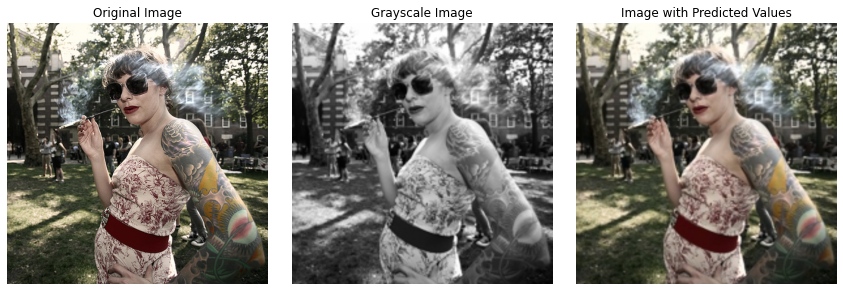

In [23]:
# Example usage of function "plot_predicted_image_1"

image = Image.open(directory +'/im1.jpg')
plot_predicted_image(image, model)

All the functions seem to be working well... Of course, we are not too impressed from the fact that this model can make a perfect prediction, as it was trained and tested only on one single image.

## Preliminary Analysis II: traning on 2 images

In [48]:
image1 = Image.open(directory + '/im1.jpg')
image2 = Image.open(directory + '/im3.jpg')

images = [image1, image2]

In [49]:
size, X_batch, Y_batch = preprocess_images(images)

In [50]:
# We use again the same model for this task
model = Sequential()
model.add(InputLayer(input_shape=(None, None, 1)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))

model.compile(optimizer='adam',loss='mse')

model.fit(x=X_batch, y=Y_batch, batch_size=1, epochs=1000)

Epoch 1/1000
2/2 [==============================] - 1s 10ms/step - loss: 0.0101
Epoch 2/1000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084
Epoch 3/1000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071
Epoch 4/1000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086
Epoch 5/1000
2/2 [==============================] - 0s 10ms/step - loss: 0.0108
Epoch 6/1000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076
Epoch 7/1000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072
Epoch 8/1000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070
Epoch 9/1000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069
Epoch 10/1000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068
Epoch 11/1000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106
Epoch 12/1000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103
Epoch 13/1000
2/2 [=======================

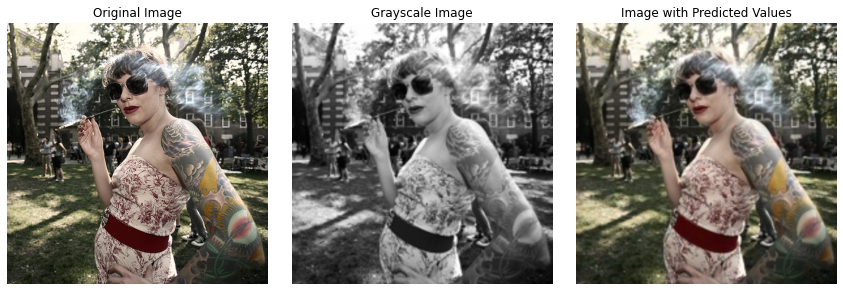

1/1 [==============================] - 0s 346ms/step - loss: 4.1224e-04
Accuracy: 99.96%


In [51]:
plot_predicted_image_2(images[0], model)

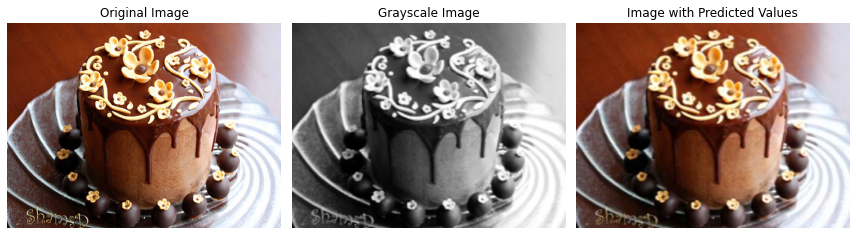

1/1 [==============================] - 0s 20ms/step - loss: 0.0010
Accuracy: 99.90%


In [52]:
plot_predicted_image_2(images[1], model)

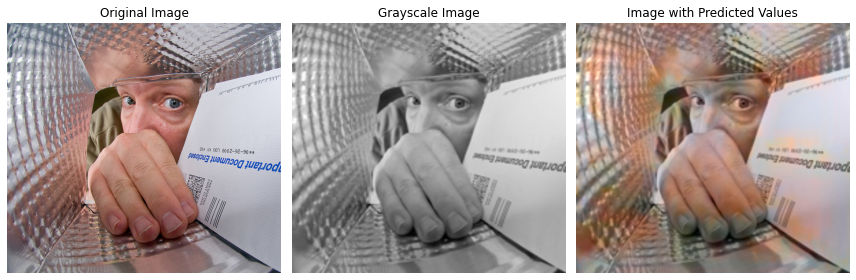

In [54]:
plot_predicted_image(Image.open(directory + '/im5.jpg'), model)

Although, as expected, the model performs well on the two training images, its performance is not particularly nice when faced with unseen images. 

## Useful Functions

In this very short subsection, we define some functions which will be very useful in our analysis. 
- **data_generator**: takes as input a directory and a batch size, and returns a data loader which will allow us to train the model on the whole dataset without having to load it all at once
- **load_images_from_directory**: takes as input a directory and an integer n, and outputs an array of dimension **(n, height, width, 3)**,which is an array of n images
- **visualize_predictions**: takes as input a directory, a model and an integer n, and outputs the input (greyscale) image, the original image and the predicted one. This procedure is repeated for n images coming from the chosen directory
- **all_in_one**: takes as input a model, a dataloader, some validation data, some parameters useful for the fitting step (number of epochs, steps per epoch) and some parameters useful for setting up an early stopping mechanism (patience), and it trains the model according to the parameters provided. It returns the mean validation and training loss, and it also return visual representations of the predictions calling the _visualize_predictions_ function defined before, according to some parameters.
- **plot_loss_histogram**: takes as input 2 lists of numbers and a list of names, and returns a histogram representation of the data

In [66]:
# This functions acts as a dataloader, and thus allows us to train models on the whole dataset without loading it all

def data_generator(data_dir, batch_size):
    np.random.seed(42)
    while True:
        X_batch = []
        Y_batch = []
        valid_extensions = ('.jpg', '.png', '.jpeg')
        
        # Get a batch of image paths
        all_files = os.listdir(data_dir)
        image_files = [file for file in all_files if file.lower().endswith(valid_extensions)]
        batch_paths = np.random.choice(image_files, size = int(batch_size * 1/0.8 + 1))
        

        # Load and preprocess the images
        for image_path in batch_paths:
            image = Image.open(os.path.join(data_dir, image_path))
            image = image.resize((height, width))
            image_array = img_to_array(image)

            # Preprocess the image and separate X and Y
            lab_image = rgb2lab(1.0 / 255 * image_array)
            X = lab_image[:, :, 0] / 100  # L channel as X
            Y = lab_image[:, :, 1:] / 128  # a and b channels as Y

            # Reshape and append to the batch
            X = X.reshape(height, width, 1)
            Y = Y.reshape(height, width, 2)
            X_batch.append(X)
            Y_batch.append(Y)

        # Convert to NumPy arrays and yield the batch
        X_batch = np.array(X_batch)
        Y_batch = np.array(Y_batch)
        X_batch, Y_batch = remove_outliers(X_batch, Y_batch, 0.2)
        yield X_batch, Y_batch

In [67]:
# Function which allows to easily load images from the directory

def load_images_from_directory(directory, n):    # n = number of images to import
    image_list = []
    count = 0
    
    for file_name in sorted(os.listdir(directory)):
        if count >= n:
            break
        
        if file_name.endswith(".jpeg") or file_name.endswith(".jpg") or file_name.endswith(".png"):
            image_path = os.path.join(directory, file_name)
            try:
                image = Image.open(image_path)
                image_list.append(image)
                count += 1
            except (IOError, OSError):
                print(f"Error opening image: {file_name}")
    
    return image_list

In [68]:
# FUNCTION WHICH ALLOWS TO PLOT THE PREDICTIONS

def visualize_predictions(model, directory, n):
    
    valid_extensions = ('.jpg', '.png', '.jpeg')
    np.random_seed = 42
    
    all_files = os.listdir(directory)
    image_files = [file for file in all_files if file.lower().endswith(valid_extensions)]
    batch_paths = np.random.choice(image_files, size = n)
    
    for image_path in batch_paths:
            image = Image.open(os.path.join(directory, image_path))
            plot_predicted_image(image, model)

In [69]:
# FUNCTION TO AUTOMATICALLY TRAIN A MODEL AND PLOT THE RESULTS. IT RETURNS THE LOSSES

def all_in_one(model, train_dataloader, validation_data, epochs, steps_per_epoch, patience, directory, n, pictures):
    
    np.random.seed(42)
    model.compile(optimizer='adam',loss='mse')

    early_stopping = EarlyStopping(monitor='val_loss', 
                                   patience = patience, 
                                   mode='min', 
                                   verbose=1, 
                                   min_delta=0.0001)

    
    history = model.fit(train_dataloader, 
                        steps_per_epoch = steps_per_epoch, 
                        epochs = 100, 
                        validation_data = validation_data, 
                        validation_batch_size= 32,
                        callbacks = [early_stopping]
                        )
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    min_train_loss = np.amin(loss)
    min_val_loss = np.amin(val_loss)
    
    if pictures:
        visualize_predictions(model, directory, n)
    return min_train_loss, min_val_loss

In [70]:
def plot_loss_histograms(x_data, y_data, names):
    
    x = np.arange(len(names))  
    width = 0.35  
    fig, ax = plt.subplots()
    blueshape = ax.bar(x - width/2, x_data, width, label='Train Loss')
    orangeshape = ax.bar(x + width/2, y_data, width, label='Val Loss')
    #ax.set_ylabel('Loss')
    ax.set_title('Model Losses')
    plt.xticks(x, names)
    ax.legend(loc = "best")
    #ax.bar_label(blueshape, padding=3)
    #ax.bar_label(orangeshape, padding=3)
    plt.ylim(0.01, 0.021)
    plt.show()

## Models

In this section, we will train the data on more input images and see how its performance changes.

We partitioned the initial dataset in 2 subdatasets. The first one contains 20k images, whereas the second one contains the remaining 5k. We have also chosen to set up the **batch size** to 32 because, after having extensively experimented with different batch sizes, we found that this size is the one which yields the best predictions.

We will keep some parameters fixed during the comparison. These parameters are:
- **batch_size** = 32 (after extensive testing, we found that this batch size is the one which works best for us)
- **epochs** = 100 
- **steps_per_epoch** = 30 (given that the batch size is 32, at each epoch we train the model on 960 images)
- **patience** = 10

In [66]:
validation_directory = 'data/validation'
training_directory = 'data/training'
batch_size = 32
training_loss = []             #list in which we will store the training losses of the different models
validation_loss = []           #list in which we will store the training losses of the different models

In [72]:
validation_images = load_images_from_directory(validation_directory, 500)   #load 500 images for the validation
img_shape, X_val, Y_val = preprocess_images(validation_images)              #preprocess the 500 images 
X_val, Y_val = remove_outliers(X_val, Y_val, 0.2)                           #removing the images with the lowest values in the a and b channels

In [64]:
train_dataloader = data_generator(training_directory, 32)                  #setting up the dataloader

## First Model: A Naive Approach

In [65]:
Basic_Model = Sequential()
Basic_Model.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same', input_shape = (height, width, 1)))
Basic_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Basic_Model.add(Conv2D(2, (3, 3), activation = 'tanh', padding = 'same'))
Basic_Model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 200, 200, 64)      640       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 200, 200, 32)      18464     
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 200, 200, 2)       578       
Total params: 19,682
Trainable params: 19,682
Non-trainable params: 0
_________________________________________________________________


The first model that we implement is a very simple and shallow one. It is composed of only 3 convolutional layers, with a total number of trainable parameters of 19,682, and will be useful as a benchmark to see how a very simple model performs.

Epoch 1/100
30/30 [==============================] - 20s 647ms/step - loss: 0.0214 - val_loss: 0.0182
Epoch 2/100
30/30 [==============================] - 19s 642ms/step - loss: 0.0213 - val_loss: 0.0181
Epoch 3/100
30/30 [==============================] - 19s 641ms/step - loss: 0.0199 - val_loss: 0.0181
Epoch 4/100
30/30 [==============================] - 19s 642ms/step - loss: 0.0195 - val_loss: 0.0181
Epoch 5/100
30/30 [==============================] - 19s 642ms/step - loss: 0.0195 - val_loss: 0.0181
Epoch 6/100
30/30 [==============================] - 19s 639ms/step - loss: 0.0205 - val_loss: 0.0178
Epoch 7/100
30/30 [==============================] - 19s 639ms/step - loss: 0.0217 - val_loss: 0.0178
Epoch 8/100
30/30 [==============================] - 19s 641ms/step - loss: 0.0205 - val_loss: 0.0182
Epoch 9/100
30/30 [==============================] - 19s 640ms/step - loss: 0.0210 - val_loss: 0.0180
Epoch 10/100
30/30 [==============================] - 19s 635ms/step - loss: 0.021

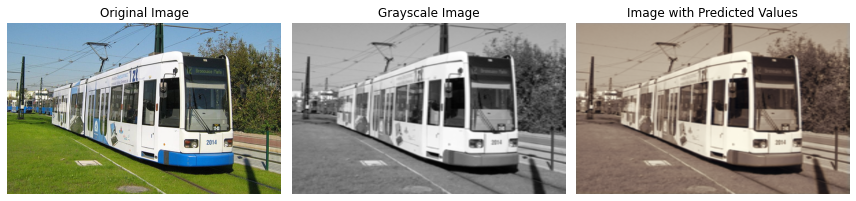

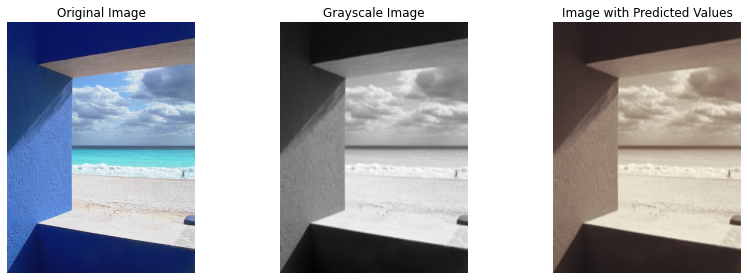

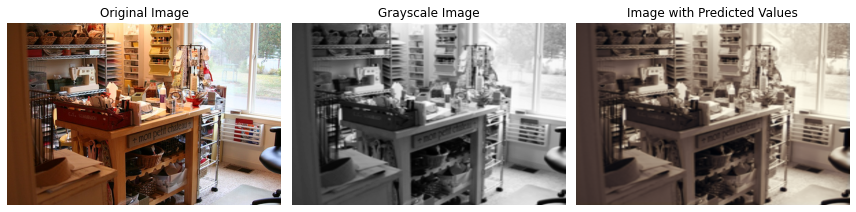

In [73]:
basic_t_loss, basic_v_loss = all_in_one(Basic_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 10, directory = validation_directory, n = 3, pictures = True)

What we notice after this first attempt is that the predictions are not of really high quality, and the model tends to color everything with this "sand" color.

## Second Model: Batch Norm and Up Sampling

In [80]:
Batch_Norm_Model = Sequential()
Batch_Norm_Model.add(InputLayer(input_shape=(height, width, 1)))
Batch_Norm_Model.add(BatchNormalization())

Batch_Norm_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Norm_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(BatchNormalization())

Batch_Norm_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Norm_Model.add(BatchNormalization())

Batch_Norm_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Norm_Model.add(UpSampling2D((2, 2)))

Batch_Norm_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(UpSampling2D((2, 2)))

Batch_Norm_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Norm_Model.add(UpSampling2D((2, 2)))

Batch_Norm_Model.add(Conv2D(2, (3, 3), activation = 'tanh', padding = 'same'))

Batch_Norm_Model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_21 (Batc (None, 200, 200, 1)       4         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 100, 100, 8)       80        
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 100, 100, 8)       584       
_________________________________________________________________
batch_normalization_22 (Batc (None, 100, 100, 8)       32        
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 100, 100, 16)      1168      
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 50, 50, 16)        2320      
_________________________________________________________________
batch_normalization_23 (Batc (None, 50, 50, 16)       

This second model in deeper and more complicated than the previous one, and features 6 blocks, where the first two are simply composed of 2 convolutional layers and one batch normalization layer, whereas the others have 2 convolutional layers and one upsampling layer. 

It is worth noticing that we have chosen the kernel size to always be the same (i.e. (3x3)), and also the activation function to be almost always **ReLU**. The only exception is the last layer, where we chose a **tanh** as activation function, because we wanted our final values to be in the range [-1,1], which is indeed the image of the hyperbolic tangent.

Epoch 1/100
30/30 [==============================] - 22s 668ms/step - loss: 0.0264 - val_loss: 0.0192
Epoch 2/100
30/30 [==============================] - 19s 648ms/step - loss: 0.0218 - val_loss: 0.0191
Epoch 3/100
30/30 [==============================] - 19s 646ms/step - loss: 0.0201 - val_loss: 0.0191
Epoch 4/100
30/30 [==============================] - 19s 647ms/step - loss: 0.0196 - val_loss: 0.0187
Epoch 5/100
30/30 [==============================] - 19s 650ms/step - loss: 0.0199 - val_loss: 0.0192
Epoch 6/100
30/30 [==============================] - 19s 646ms/step - loss: 0.0207 - val_loss: 0.0185
Epoch 7/100
30/30 [==============================] - 19s 644ms/step - loss: 0.0218 - val_loss: 0.0189
Epoch 8/100
30/30 [==============================] - 19s 647ms/step - loss: 0.0206 - val_loss: 0.0183
Epoch 9/100
30/30 [==============================] - 19s 643ms/step - loss: 0.0212 - val_loss: 0.0182
Epoch 10/100
30/30 [==============================] - 19s 644ms/step - loss: 0.021

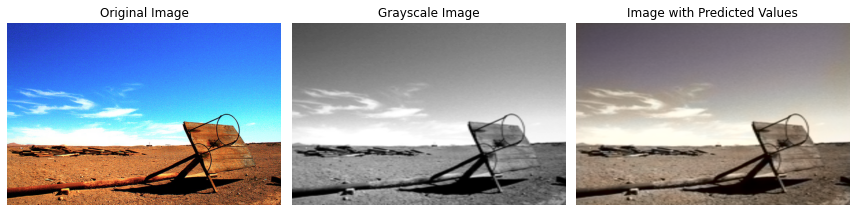

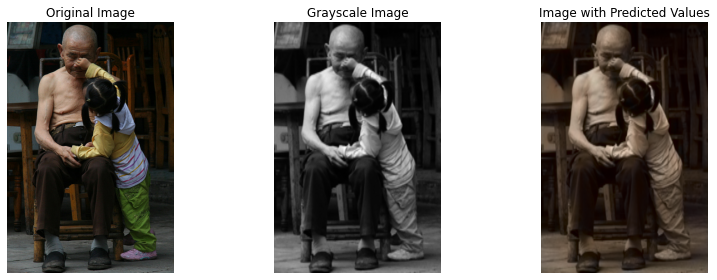

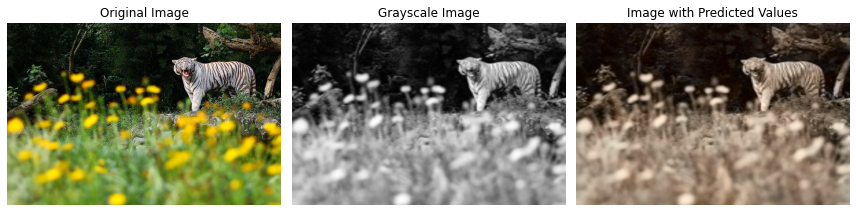

In [81]:
batch_t_loss, batch_v_loss = all_in_one(Batch_Norm_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 10, directory = validation_directory, n = 3, pictures = True)

In [83]:
training_loss.append(basic_t_loss)             
validation_loss.append(basic_v_loss)
training_loss.append(batch_t_loss)             
validation_loss.append(batch_v_loss)

As we can notice, this second model has not provided particularly good predictions (although already better than the benchmark model). On a positive note, it seems that the model has been able to notice that the uppermost part of the first picture represented a sky, and colored it accordingly.

## Model 3: Skip Connections

After obtaining unsatisfactory results with the first two models, we decided to conduct a literature review to gain a clearer understanding of how to improve it.

The model that we are about to introduce we designed by taking inspiration from the architecture of **UNet**. 

The model consists of two main parts: a _downsampling path_ and an _upsampling path_, connected by skip connections.
- The **downsampling path** is useful to extract relevant features from the input image. We decided to include a layer normalization to improve convergence during training. The data is downsampled using max pooling, which reduces the spatial dimensions of the features while preserving their important characteristics.
- The **upsampling path** reconstructs the image size from the extracted features, using transposed convolutional layers. This process enlarges the spatial dimensions, allowing the model to generate a colorized output of the same size as the input image.

The skip connections play a crucial role in our model, as they allow information from different resolutions to be combined. Inspired by the U-Net architecture, these connections enable the model to combine low-level details and high-level contextual information: this helps the model to refine the colorization process by utilizing both local and global features.

In [84]:
def skip_connection():
    inputs = layers.Input(shape =(height, width, 1))

    # Downsampling path
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv1)
    conv1 = layers.LayerNormalization(epsilon=1e-6)(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv2)
    conv2 = layers.LayerNormalization(epsilon=1e-6)(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottom
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv3)

    # Upsampling path
    up4 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv3)
    up4 = layers.concatenate([up4, conv2])
    up4 = layers.LayerNormalization(epsilon=1e-6)(up4)
    conv4 = layers.Conv2D(64, 3, activation='relu', padding='same')(up4)
    conv4 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv4)
    
    up5 = layers.Conv2DTranspose(32, 2, strides=(2, 2), padding='same')(conv4)
    up5 = layers.concatenate([up5, conv1])
    up5 = layers.LayerNormalization(epsilon=1e-6)(up5)
    conv5 = layers.Conv2D(32, 3, activation='relu', padding='same')(up5)
    conv5 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv5)

    # Output
    outputs = layers.Conv2D(2, (3,3), activation='tanh', padding = 'same')(conv5)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [86]:
Skip_Model = skip_connection()
Skip_Model.summary()

Model: "model_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 200, 200, 1) 0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, 200, 200, 32) 320         input_14[0][0]                   
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 200, 200, 32) 9248        conv2d_94[0][0]                  
__________________________________________________________________________________________________
layer_normalization_31 (LayerNo (None, 200, 200, 32) 64          conv2d_95[0][0]                  
___________________________________________________________________________________________

Epoch 1/100
30/30 [==============================] - 36s 1s/step - loss: 0.0470 - val_loss: 0.0200
Epoch 2/100
30/30 [==============================] - 32s 1s/step - loss: 0.0221 - val_loss: 0.0192
Epoch 3/100
30/30 [==============================] - 33s 1s/step - loss: 0.0214 - val_loss: 0.0185
Epoch 4/100
30/30 [==============================] - 33s 1s/step - loss: 0.0209 - val_loss: 0.0181
Epoch 5/100
30/30 [==============================] - 33s 1s/step - loss: 0.0200 - val_loss: 0.0187
Epoch 6/100
30/30 [==============================] - 33s 1s/step - loss: 0.0209 - val_loss: 0.0185
Epoch 7/100
30/30 [==============================] - 33s 1s/step - loss: 0.0217 - val_loss: 0.0182
Epoch 8/100
30/30 [==============================] - 33s 1s/step - loss: 0.0212 - val_loss: 0.0183
Epoch 9/100
30/30 [==============================] - 33s 1s/step - loss: 0.0209 - val_loss: 0.0182
Epoch 10/100
30/30 [==============================] - 33s 1s/step - loss: 0.0211 - val_loss: 0.0183
Epoch 11/

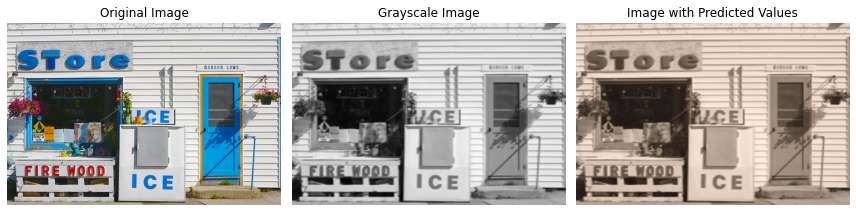

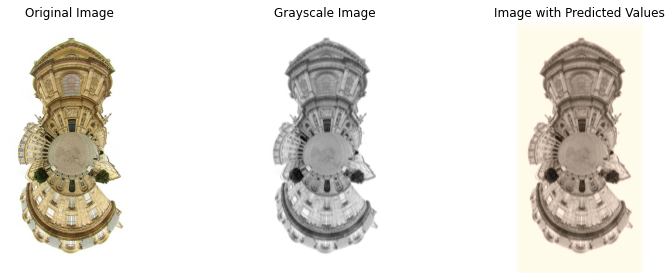

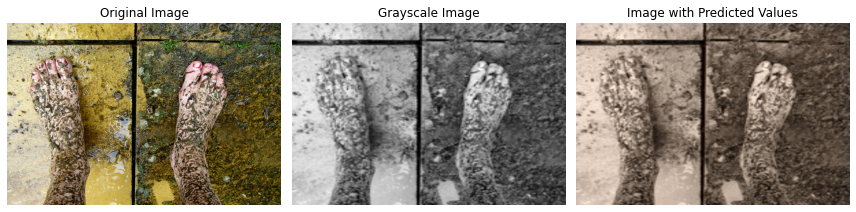

In [87]:
skip_t_loss, skip_v_loss = all_in_one(Skip_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 10, directory = validation_directory, n = 3, pictures = True)

In [88]:
training_loss.append(skip_t_loss)             
validation_loss.append(skip_v_loss)

Unfortunately, the results don't seem to be improving. As a result, we decided to make a modification to the previous model in order to encourage it to recognize specific patterns and enhance the quality of predictions. To achieve this, we decided to add a multi-headed self-attention block.

## Model 4: Attention

This model again consists of structure similar to U-Net, with the addition of an Attention Block in the bottom phase.

The Attention Block incorporates a Multi-Head Attention layer, which performs self-attention on the feature maps. Self-attention allows the model to assign varying levels of importance to different spatial locations based on their contextual relevance. By introducing this, our model should dynamically emphasize important regions and suppress irrelevant information during the colorization process.

In [121]:
def MultiHeadAttention(inputs, num_heads):
    attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=32)
    x = attention(inputs, inputs)
    x = layers.LayerNormalization(epsilon=1e-6)(x)
    x = layers.Dropout(0.5)(x)
    return x

def attention_net(num_heads):
    inputs = layers.Input(shape =(height, width, 1))

    # Downsampling path
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool2)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Self-attention
    self_att = MultiHeadAttention(conv3, num_heads)

    # Upsampling path
    conv4 = layers.Conv2DTranspose(64, 3, activation='relu', padding='same')(self_att)
    up4 = layers.UpSampling2D(size=(2, 2))(conv4)
    conv5 = layers.Conv2DTranspose(32, 3, activation='relu', padding='same')(up4)
    up5 = layers.UpSampling2D(size=(2, 2))(conv5)
    conv6 = layers.Conv2DTranspose(64, 3, activation='relu', padding='same')(up5)
#    up6 = layers.UpSampling2D(size=(2, 2))(conv6)

    # Output channels a and b
    output = layers.Conv2D(2, 3, activation='tanh', padding='same')(conv6)

    model = keras.Model(inputs=inputs, outputs=output)
    return model

num_heads = 3
Attention_Model = attention_net(num_heads)
Attention_Model.summary()

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 200, 200, 1) 0                                            
__________________________________________________________________________________________________
conv2d_109 (Conv2D)             (None, 200, 200, 32) 320         input_16[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_38 (MaxPooling2D) (None, 100, 100, 32) 0           conv2d_109[0][0]                 
__________________________________________________________________________________________________
conv2d_110 (Conv2D)             (None, 100, 100, 64) 18496       max_pooling2d_38[0][0]           
___________________________________________________________________________________________

Epoch 1/100
30/30 [==============================] - 40s 1s/step - loss: 0.0518 - val_loss: 0.0188
Epoch 2/100
30/30 [==============================] - 39s 1s/step - loss: 0.0222 - val_loss: 0.0188
Epoch 3/100
30/30 [==============================] - 38s 1s/step - loss: 0.0218 - val_loss: 0.0189
Epoch 4/100
30/30 [==============================] - 38s 1s/step - loss: 0.0212 - val_loss: 0.0185
Epoch 5/100
30/30 [==============================] - 38s 1s/step - loss: 0.0201 - val_loss: 0.0185
Epoch 6/100
30/30 [==============================] - 38s 1s/step - loss: 0.0210 - val_loss: 0.0184
Epoch 7/100
30/30 [==============================] - 38s 1s/step - loss: 0.0220 - val_loss: 0.0185
Epoch 8/100
30/30 [==============================] - 38s 1s/step - loss: 0.0217 - val_loss: 0.0185
Epoch 9/100
30/30 [==============================] - 38s 1s/step - loss: 0.0213 - val_loss: 0.0185
Epoch 10/100
30/30 [==============================] - 38s 1s/step - loss: 0.0213 - val_loss: 0.0185
Epoch 11/

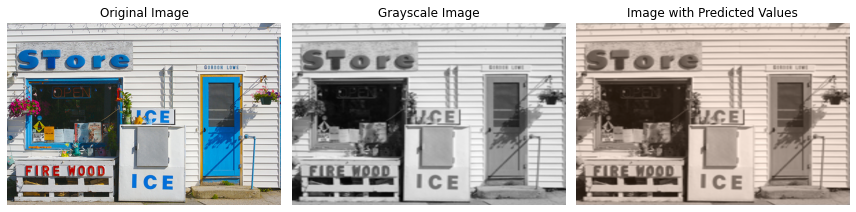

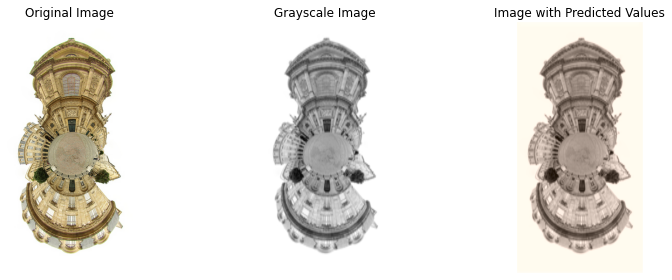

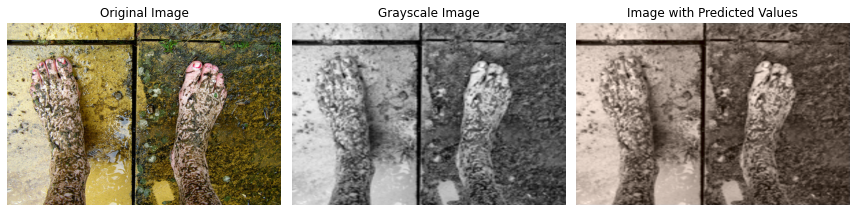

In [122]:
att_t_loss, att_v_loss = all_in_one(Attention_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 10, directory = validation_directory, n = 3, pictures = True)

In [123]:
training_loss.append(att_t_loss)
validation_loss.append(att_v_loss)

## Comparison

After having performed predictions with all the three models we designed, we are now ready to do a comparison and choose the model which performs best.

In [129]:
names = ['Basic_Model',
         'Batch_Model',
         'Skip_Model',
         'Attention_Model'
        ]

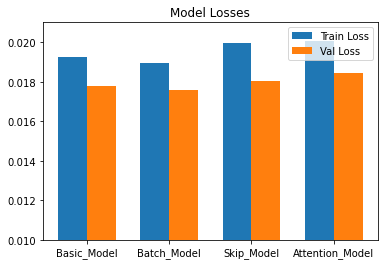

In [130]:
plot_loss_histograms(training_loss, validation_loss, names)

As we can see from the histograms, the model which performed better in terms of validation loss is the second one.

## First Section: Conclusion

After having experimented on the Mirflickr dataset using the 4 aforementioned models, we have not reached satisfactory results. All the models more or less made predictions in the same way, namely by simply coloring the whole image with a sand color. The only positive aspect was that the second model, which was also the best one, was able to correctly color the sky in some of the validation images.

Our conclusions are that the Mirflickr dataset is just too big and various, with many images of different types, which most often do not share any similarity between each other. This made it very hard for our model to pick up features and regularities in the dataset, and it caused it to simply converge to a local minimum.

We believe that all the models color the image with the light brown color because such color helps minimizing the MSE, as it is quite light and likely close to many values of the actual pixels.

The fact that there has not been much of a difference between predictions made by a very shallow model and predictions made by elaborate models with attention modules and skip connections is, in our opinion, an indicator that the dataset is just too various and hard to be learned.

---

# Second Section: Stanford Dogs Dataset

After having reached only modest results in the first section, we have decided to try our models on a more self consistent dataset, which is the **Stanford Dogs Dataset**.

This dataset contains thousands of images of dogs, and is divided into different classes (based on the type of dog). 

To start, we will restrict our attention to only one class of dogs. Unfortunately, unlike the previous dataset, this one only has 150 images per type of dog, therefore we will perform our first training with only 150 images (split between training and validation), and later we will perform some data augmentation to get some extra images.

### Image Description

In [27]:
training_directory = 'data/GoldenRetriever/training'
validation_directory = 'data/GoldenRetriever/validation'

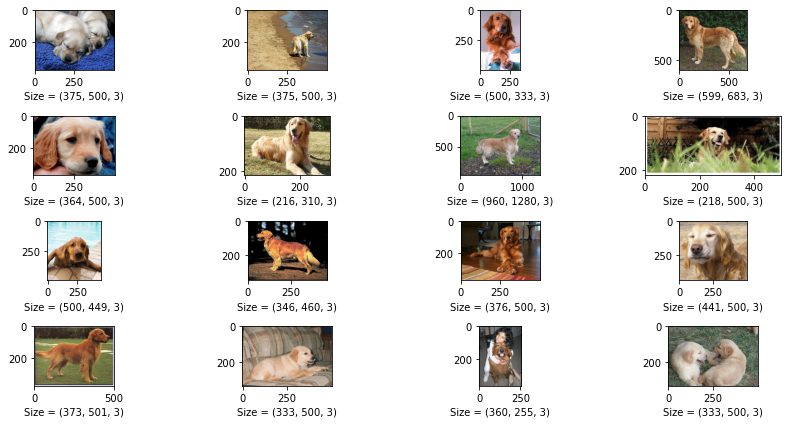

In [19]:
display_images(training_directory)

This dataset is made of RGB pictures of Golden Retrievers. The pictures come in many different shapes and will therefore need preprocessing.

In [139]:
train_images = load_images_from_directory(training_directory, n = 120)
val_images = load_images_from_directory(validation_directory, n = 30)

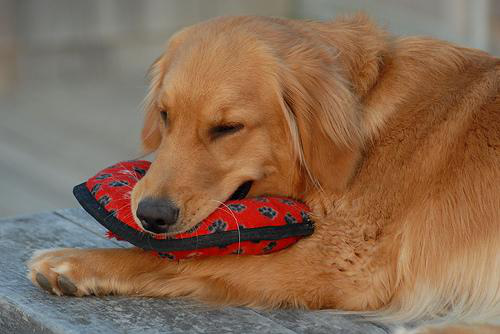

In [82]:
train_images[0]

### Model Training

The model that we decided to use in this section is the one which performed best in the previous one, namely the Batch_Norm_Model. 

We must remark that, contrary to before, we will change the parameters between the different models in order to optimize the preictions of the model.

In [143]:
img_shapes, X_val, Y_val = preprocess_images(val_images)
batch_size = 8
train_dataloader = data_generator(training_directory, batch_size)

In [144]:
Batch_Dogs_Model = Sequential()
Batch_Dogs_Model.add(InputLayer(input_shape=(height, width, 1)))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(2, (3, 3), activation = 'tanh', padding = 'same'))

Epoch 1/100
15/15 [==============================] - 6s 177ms/step - loss: 0.0226 - val_loss: 0.0169
Epoch 2/100
15/15 [==============================] - 3s 186ms/step - loss: 0.0137 - val_loss: 0.0139
Epoch 3/100
15/15 [==============================] - 2s 155ms/step - loss: 0.0135 - val_loss: 0.0113
Epoch 4/100
15/15 [==============================] - 3s 183ms/step - loss: 0.0148 - val_loss: 0.0115
Epoch 5/100
15/15 [==============================] - 2s 147ms/step - loss: 0.0124 - val_loss: 0.0112
Epoch 6/100
15/15 [==============================] - 2s 146ms/step - loss: 0.0131 - val_loss: 0.0110
Epoch 7/100
15/15 [==============================] - 2s 150ms/step - loss: 0.0122 - val_loss: 0.0110
Epoch 8/100
15/15 [==============================] - 2s 144ms/step - loss: 0.0124 - val_loss: 0.0113
Epoch 9/100
15/15 [==============================] - 2s 150ms/step - loss: 0.0154 - val_loss: 0.0110
Epoch 10/100
15/15 [==============================] - 2s 158ms/step - loss: 0.0136 - val_lo

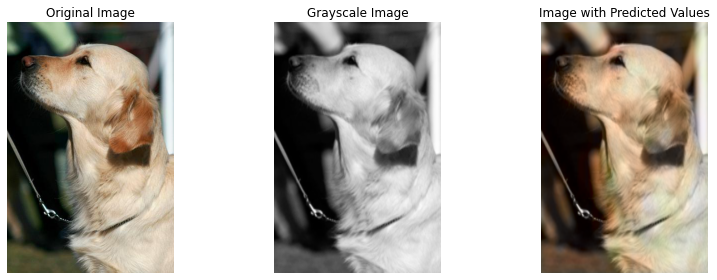

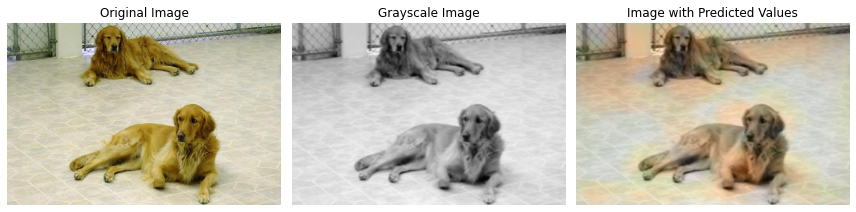

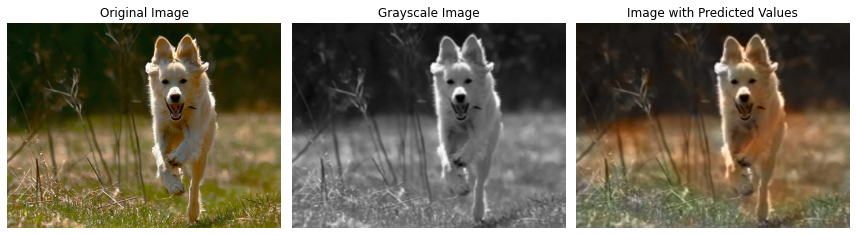

In [145]:
train_loss, val_loss = all_in_one(Batch_Dogs_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 15, patience = 50, directory = validation_directory, n = 3, pictures = True)

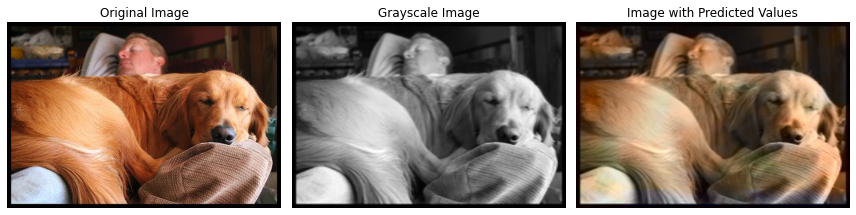

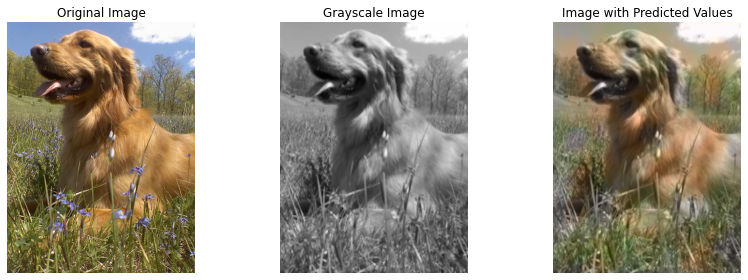

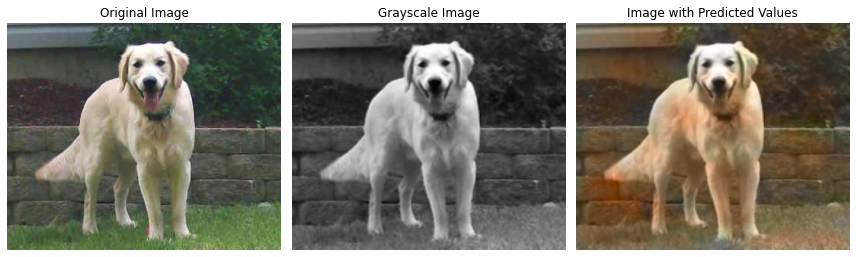

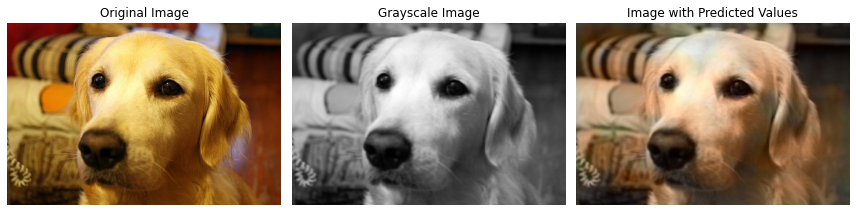

In [153]:
visualize_predictions(Batch_Dogs_Model, validation_directory, 4)

The results are still not incredible, but we are finally getting closer to a good prediction. It is worth noticing that the model seems to be able to recognize grass, leaves and trees, and thus to correctly color these elements in green. It also seems that it notices when there is a dog in the picture, but the coloring is not precise, and it is simply a wide box around the animal. 

### Data Augmentation

We now create an ImageDataGenerator object which will iteratively take images from the training dataset, modify them, and then add the modified versions to a new directory

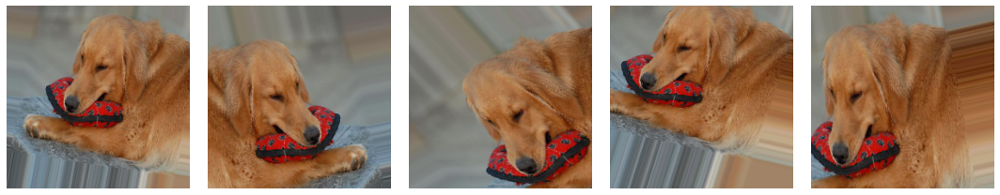

In [156]:
# EXAMPLE OF HOW THE GENERATOR WILL WORK

aug_generator = ImageDataGenerator(
    rotation_range=40,         # Random rotation between -40 and 40 degrees
    width_shift_range=0.2,     # Randomly shift the width by 20%
    height_shift_range=0.2,    # Randomly shift the height by 20%
    shear_range=0.2,           # Shear transformations with intensity of 20%
    zoom_range=0.2,            # Randomly zoom by 20%
    horizontal_flip=True,      # Randomly flip images horizontally
    vertical_flip=False,       # Do not flip images vertically
    fill_mode='nearest'        # Fill any newly created pixels after rotation or shifting
)

img_path = 'data/GoldenRetriever/training/n02099601_10.jpg'
img = load_img(img_path, target_size=(224, 224))

# Convert the image to an array
x = img_to_array(img)
x = np.expand_dims(x, axis=0)

# Generate augmented images
aug_iter = aug_generator.flow(x, batch_size=1)

# Generate and preview augmented images
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
axes = axes.ravel()

for i in range(5):
    augmented_image = next(aug_iter)[0].astype(np.uint8)
    axes[i].imshow(augmented_image)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [158]:
# Directory containing the images
image_directory = 'data/GoldenRetriever/training'


for filename in os.listdir(image_directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
       
        image_path = os.path.join(image_directory, filename)

        
        img = load_img(image_path, target_size = (height, width))

        
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        # Creation of a Directory to store the newly generated images
        augmented_directory = os.path.join('data/GoldenRetriever/augmented_training_2')
        os.makedirs(augmented_directory, exist_ok = True)

        # Generation of augmented images
        aug_iter = aug_generator.flow(x, batch_size = 1, save_to_dir = augmented_directory, save_prefix = 'aug_', save_format = 'jpeg')

        
        num_augmented = 10  # Number of augmented images to generate
        for _ in range(num_augmented):
            augmented_image = next(aug_iter)[0].astype('uint8')

        print(f"Augmented images saved for {filename}")

print("Data augmentation completed.")

Augmented images saved for n02099601_5655.jpg
Augmented images saved for n02099601_5876.jpg
Augmented images saved for n02099601_6814.jpg
Augmented images saved for n02099601_1010.jpg
Augmented images saved for n02099601_5452.jpg
Augmented images saved for n02099601_3004.jpg
Augmented images saved for n02099601_176.jpg
Augmented images saved for n02099601_5051.jpg
Augmented images saved for n02099601_3327.jpg
Augmented images saved for n02099601_304.jpg
Augmented images saved for n02099601_864.jpg
Augmented images saved for n02099601_2691.jpg
Augmented images saved for n02099601_3073.jpg
Augmented images saved for n02099601_5736.jpg
Augmented images saved for n02099601_3202.jpg
Augmented images saved for n02099601_238.jpg
Augmented images saved for n02099601_100.jpg
Augmented images saved for n02099601_2029.jpg
Augmented images saved for n02099601_5642.jpg
Augmented images saved for n02099601_6338.jpg
Augmented images saved for n02099601_825.jpg
Augmented images saved for n02099601_280

## Model Training on Augmented Data

In [30]:
batch_size = 8
train_dataloader = data_generator('data/GoldenRetriever/augmented_training_2', batch_size)
val_images = load_images_from_directory(validation_directory, n = 30)
img_shapes, X_val, Y_val = preprocess_images(val_images)

In [31]:
Batch_Dogs_Model = Sequential()
Batch_Dogs_Model.add(InputLayer(input_shape=(height, width, 1)))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(2, (3, 3), activation = 'tanh', padding = 'same'))

In [32]:
train_loss, val_loss = all_in_one(Batch_Dogs_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 50, directory = validation_directory, n = 5, pictures = False)

Epoch 1/100
30/30 [==============================] - 6s 116ms/step - loss: 0.0239 - val_loss: 0.0143
Epoch 2/100
30/30 [==============================] - 3s 117ms/step - loss: 0.0135 - val_loss: 0.0119
Epoch 3/100
30/30 [==============================] - 3s 100ms/step - loss: 0.0136 - val_loss: 0.0118
Epoch 4/100
30/30 [==============================] - 3s 99ms/step - loss: 0.0127 - val_loss: 0.0116
Epoch 5/100
30/30 [==============================] - 3s 99ms/step - loss: 0.0133 - val_loss: 0.0108
Epoch 6/100
30/30 [==============================] - 3s 98ms/step - loss: 0.0139 - val_loss: 0.0104
Epoch 7/100
30/30 [==============================] - 3s 99ms/step - loss: 0.0133 - val_loss: 0.0106
Epoch 8/100
30/30 [==============================] - 3s 99ms/step - loss: 0.0138 - val_loss: 0.0111
Epoch 9/100
30/30 [==============================] - 3s 98ms/step - loss: 0.0119 - val_loss: 0.0099
Epoch 10/100
30/30 [==============================] - 3s 99ms/step - loss: 0.0132 - val_loss: 0.0

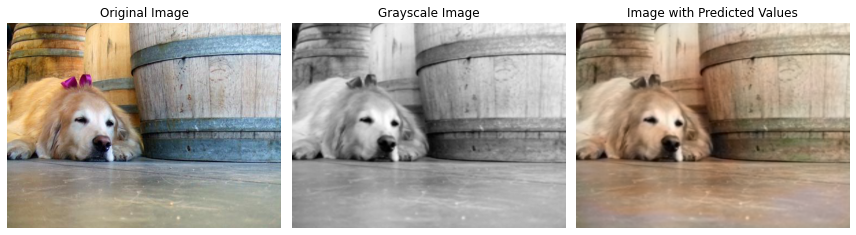

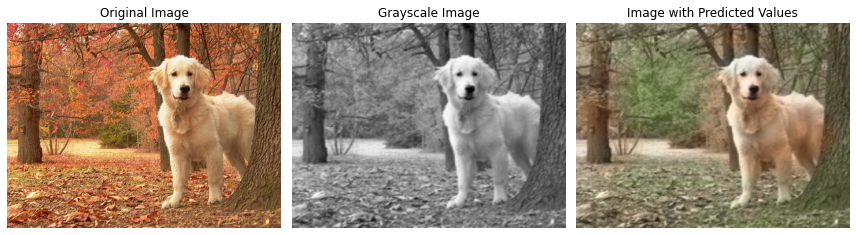

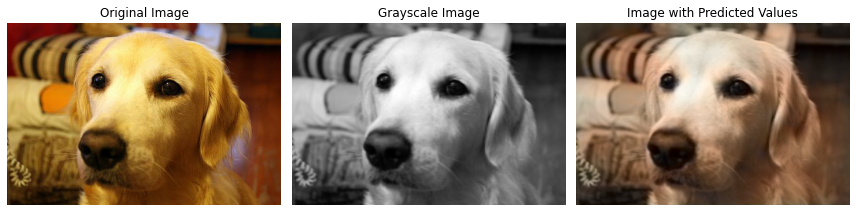

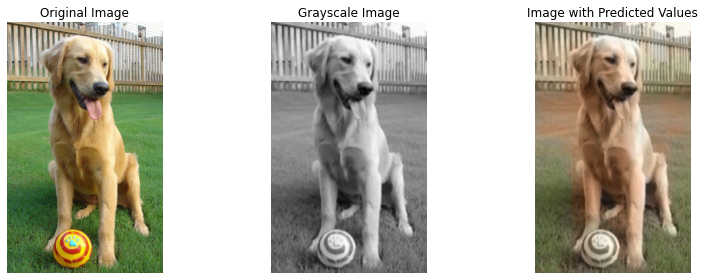

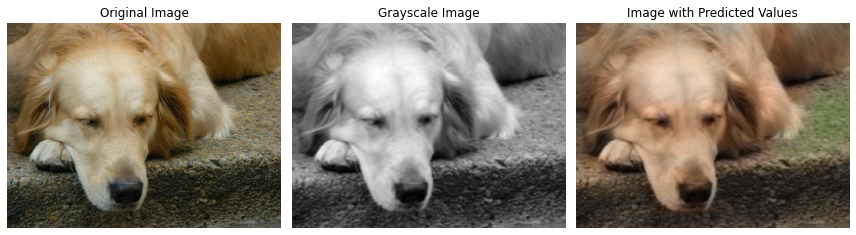

In [51]:
visualize_predictions(Batch_Dogs_Model, validation_directory, 5)

The predictions now seem to have finally improved!

We can see that the model now makes reasonable predictions from the grayscale images it is given. In particular, we can see that it is now able to recognize when there is a dog in the picture, and it is able to color it in the correct way. Moreover, we can see that the model has also learned to color the grass in green, and it has learned that if there is a dog, it is likely that there is grass around it.

We are also very happy because in this training, the validation error has dropped to only 0.0095, which is lower than it was in the previous trainings on this dataset (around 0.0097), and orders of magnitude smaller than the one we had in the Mirflickr dataset.

For the sake of curiosity, we try to train also the Skip connection model defined in the previous section on this new, simpler dataset.

In [52]:
def skip_connection():
    inputs = layers.Input(shape =(height, width, 1))

    # Downsampling path
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv1)
    conv1 = layers.LayerNormalization(epsilon=1e-6)(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv2)
    conv2 = layers.LayerNormalization(epsilon=1e-6)(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottom
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv3)

    # Upsampling path
    up4 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv3)
    up4 = layers.concatenate([up4, conv2])
    up4 = layers.LayerNormalization(epsilon=1e-6)(up4)
    conv4 = layers.Conv2D(64, 3, activation='relu', padding='same')(up4)
    conv4 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv4)
    
    up5 = layers.Conv2DTranspose(32, 2, strides=(2, 2), padding='same')(conv4)
    up5 = layers.concatenate([up5, conv1])
    up5 = layers.LayerNormalization(epsilon=1e-6)(up5)
    conv5 = layers.Conv2D(32, 3, activation='relu', padding='same')(up5)
    conv5 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv5)

    # Output
    outputs = layers.Conv2D(2, (3,3), activation='tanh', padding = 'same')(conv5)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [53]:
Skip_Model = skip_connection()

In [54]:
train_loss_2, val_loss_2 = all_in_one(Skip_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 50, directory = validation_directory, n = 5, pictures = False)

Epoch 1/100
30/30 [==============================] - 17s 442ms/step - loss: 0.0425 - val_loss: 0.0117
Epoch 2/100
30/30 [==============================] - 11s 377ms/step - loss: 0.0162 - val_loss: 0.0111
Epoch 3/100
30/30 [==============================] - 9s 300ms/step - loss: 0.0148 - val_loss: 0.0123
Epoch 4/100
30/30 [==============================] - 9s 301ms/step - loss: 0.0140 - val_loss: 0.0108
Epoch 5/100
30/30 [==============================] - 9s 302ms/step - loss: 0.0141 - val_loss: 0.0102
Epoch 6/100
30/30 [==============================] - 9s 301ms/step - loss: 0.0144 - val_loss: 0.0101
Epoch 7/100
30/30 [==============================] - 9s 301ms/step - loss: 0.0150 - val_loss: 0.0103
Epoch 8/100
30/30 [==============================] - 9s 301ms/step - loss: 0.0152 - val_loss: 0.0103
Epoch 9/100
30/30 [==============================] - 9s 301ms/step - loss: 0.0134 - val_loss: 0.0104
Epoch 10/100
30/30 [==============================] - 9s 302ms/step - loss: 0.0131 - val_

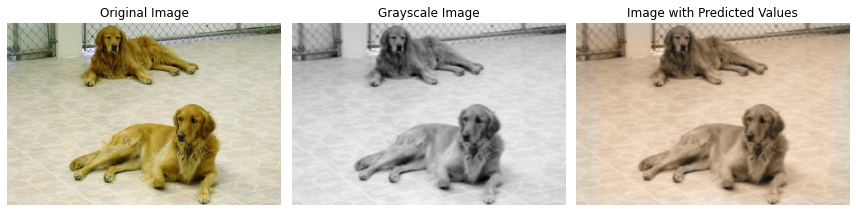

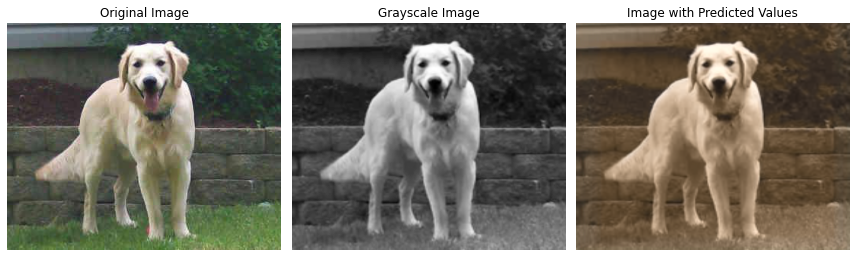

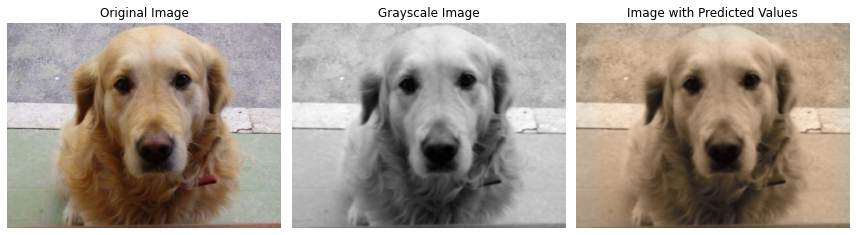

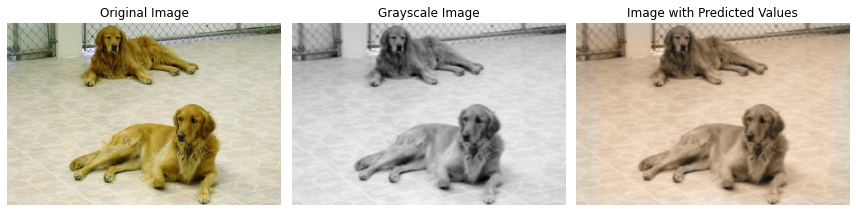

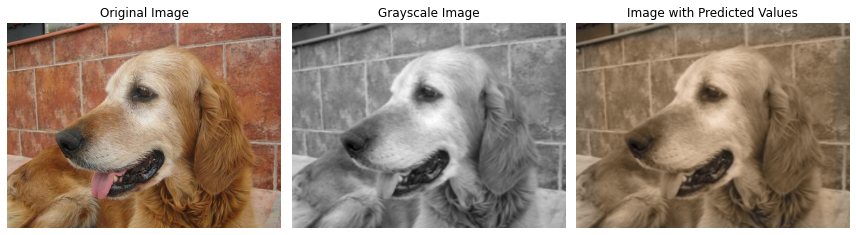

In [55]:
visualize_predictions(Skip_Model, validation_directory, 5)

Unfortunately for us, this model has the same problem as the ones highlighted in the First Section, therefore we will stick to the Batch_Norm_Model for the next predictions.

---

## Stanford Dataset, 2 Different Dog Types

After having obtained pretty good predictions with the previous model trained on a simple dataset of only Golden Retrievers, we have decided to now train our model on a mixed dataset, where there are both Golden Retrievers and Huskys. 

In [71]:
training_directory = 'data/Dogs/training'
validation_directory = 'data/Dogs/validation'

In [72]:
aug_generator = ImageDataGenerator(
    rotation_range=40,         # Random rotation between -40 and 40 degrees
    width_shift_range=0.2,     # Randomly shift the width by 20%
    height_shift_range=0.2,    # Randomly shift the height by 20%
    shear_range=0.2,           # Shear transformations with intensity of 20%
    zoom_range=0.2,            # Randomly zoom by 20%
    horizontal_flip=True,      # Randomly flip images horizontally
    vertical_flip=False,       # Do not flip images vertically
    fill_mode='nearest'        # Fill any newly created pixels after rotation or shifting
)

image_directory = training_directory


for filename in os.listdir(image_directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
       
        image_path = os.path.join(image_directory, filename)

        
        img = load_img(image_path, target_size = (height, width))

        
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        # Creation of a Directory to store the newly generated images
        augmented_directory = os.path.join('data/Dogs/augmented_training_2')
        os.makedirs(augmented_directory, exist_ok = True)

        # Generate augmented images
        aug_iter = aug_generator.flow(x, batch_size = 1, save_to_dir = augmented_directory, save_prefix = 'aug_', save_format = 'jpeg')

        
        num_augmented = 10  # Number of augmented images to generate
        for _ in range(num_augmented):
            augmented_image = next(aug_iter)[0].astype('uint8')

        print(f"Augmented images saved for {filename}")

print("Data augmentation completed.")

Augmented images saved for n02110185_4677.jpg
Augmented images saved for n02099601_5655.jpg
Augmented images saved for n02110185_3291.jpg
Augmented images saved for n02110185_5973.jpg
Augmented images saved for n02099601_5876.jpg
Augmented images saved for n02099601_6814.jpg
Augmented images saved for n02099601_1010.jpg
Augmented images saved for n02110185_8860.jpg
Augmented images saved for n02110185_2368.jpg
Augmented images saved for n02110185_6775.jpg
Augmented images saved for n02110185_353.jpg
Augmented images saved for n02099601_5452.jpg
Augmented images saved for n02110185_4030.jpg
Augmented images saved for n02110185_2701.jpg
Augmented images saved for n02099601_3004.jpg
Augmented images saved for n02110185_1066.jpg
Augmented images saved for n02099601_176.jpg
Augmented images saved for n02099601_5051.jpg
Augmented images saved for n02110185_9086.jpg
Augmented images saved for n02099601_3327.jpg
Augmented images saved for n02099601_304.jpg
Augmented images saved for n02099601_

In [73]:
batch_size = 16
train_dataloader = data_generator('data/GoldenRetriever/augmented_training_2', batch_size)
val_images = load_images_from_directory(validation_directory, n = 60)
img_shapes, X_val, Y_val = preprocess_images(val_images)

In [74]:
Batch_Dogs_Model = Sequential()
Batch_Dogs_Model.add(InputLayer(input_shape=(height, width, 1)))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(Conv2D(8, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(BatchNormalization())

Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same', strides=2))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(Conv2D(16, (3, 3), activation = 'relu', padding = 'same'))
Batch_Dogs_Model.add(UpSampling2D((2, 2)))

Batch_Dogs_Model.add(Conv2D(2, (3, 3), activation = 'tanh', padding = 'same'))

In [75]:
train_loss, val_loss = all_in_one(Batch_Dogs_Model, train_dataloader, (X_val, Y_val), epochs = 100, steps_per_epoch = 30, patience = 50, directory = validation_directory, n = 5, pictures = False)

Epoch 1/100
30/30 [==============================] - 9s 247ms/step - loss: 0.0165 - val_loss: 0.0100
Epoch 2/100
30/30 [==============================] - 6s 192ms/step - loss: 0.0127 - val_loss: 0.0098
Epoch 3/100
30/30 [==============================] - 6s 191ms/step - loss: 0.0122 - val_loss: 0.0097
Epoch 4/100
30/30 [==============================] - 6s 191ms/step - loss: 0.0129 - val_loss: 0.0097
Epoch 5/100
30/30 [==============================] - 6s 189ms/step - loss: 0.0125 - val_loss: 0.0097
Epoch 6/100
30/30 [==============================] - 6s 190ms/step - loss: 0.0112 - val_loss: 0.0098
Epoch 7/100
30/30 [==============================] - 6s 191ms/step - loss: 0.0120 - val_loss: 0.0098
Epoch 8/100
30/30 [==============================] - 6s 189ms/step - loss: 0.0129 - val_loss: 0.0099
Epoch 9/100
30/30 [==============================] - 6s 191ms/step - loss: 0.0126 - val_loss: 0.0112
Epoch 10/100
30/30 [==============================] - 6s 192ms/step - loss: 0.0112 - val_lo

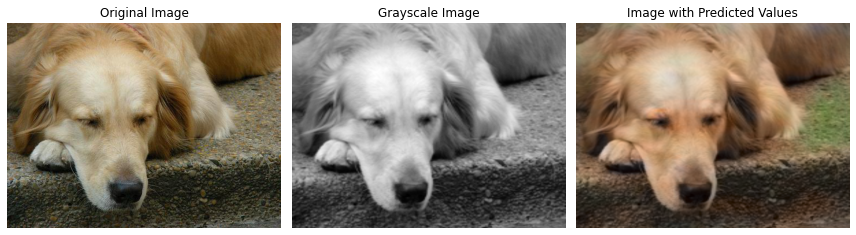

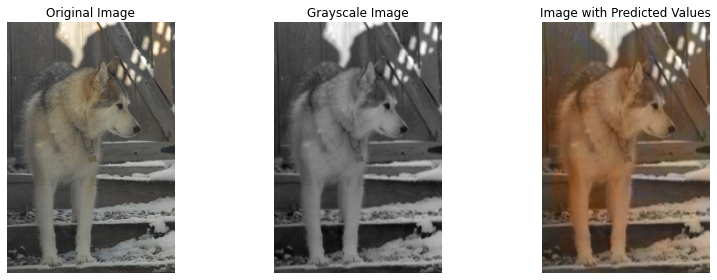

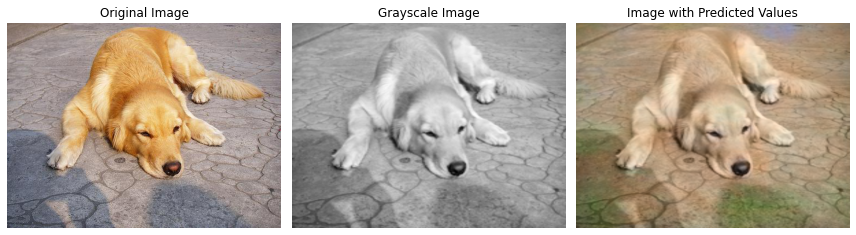

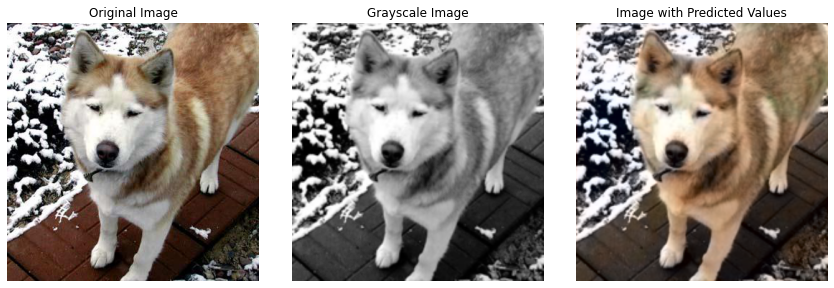

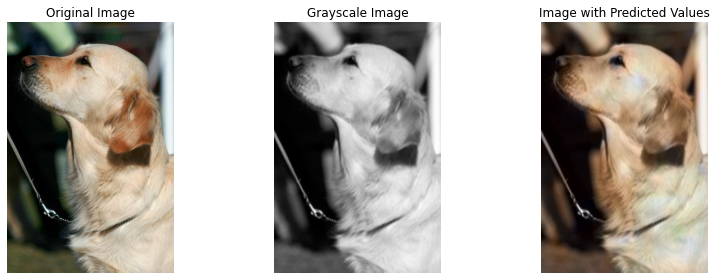

In [101]:
visualize_predictions(Batch_Dogs_Model, validation_directory, 5)

The results obtained by training our model on two different classes of dogs are quite modest. We notice that this kind of predictions share the same problems of the ones in the MIRFlickr dataset, and we deduce that it is because now the model has to not only spot dogs, but also to understand which kind of dog it is, which is another different task, especially with such little data.

---

## Second Section: Conclusion

To sum up our results, the model which generated the best predictions across the different datasets it the one we called **Batch_Norm_Model**, which featured different blocks of convolutional layers, batch norm layers and up sampling layers.

As predicted, exposing the model to a dataset which only features similar images, such as the Stanford Dogs Dataset, dramatically improved the quality of our predictions.

In conclusion, we are happy to report that image colorization seems possible, when there are enough images for each class of data. Building a model to predict the colors of a particular subject (i.e. golden retrievers) is quite easy, even with not so many images, using some techniques of data augmentation and a not so complex neural network.

When using a multi-domain dataset (the MIRFlickr-25000), we never succeded to obtain a MSE smaller than roughly 0.0180. This led the images to be colorized with what seemed to be a blend of all the colors. But the convolutional neural networks we tried were always quite good at recognizing shapes and shades.

When using a dataset that was tailored to different classes (thus containing various samples of similar subjects) we were able to obtain better results, with our model being able to colorize the main subjects and most of the backgrounds with plausible colors.